## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


# Camera Calibration  

## Brieﬂy state how you computed the camera matrix and distortion coefﬁcients. Provide an example of a distortion corrected calibration image. 

OpenCV functions or other methods were used to calculate the correct camera matrix and distortion coefﬁcients using the calibration chessboard images provided in the repository (note these are 9x6 chessboard images, unlike the 8x6imagesusedinthelesson).Thedistortionmatrixshould be used to un-distort one of the calibration images provided as a demonstration that the calibration is correct. Example of undistorted calibration image is Included in the writeup (or saved to a folder).


## Step1: Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

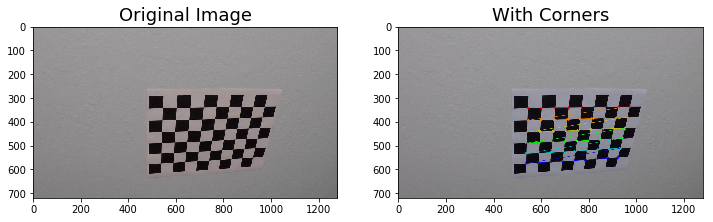

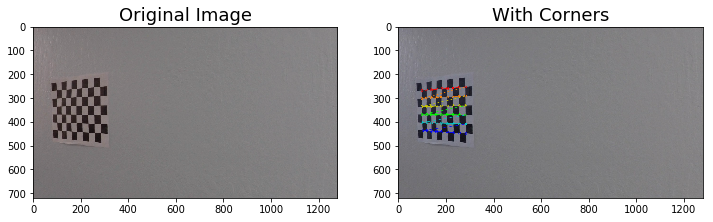

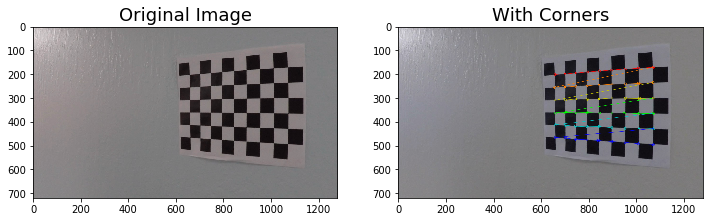

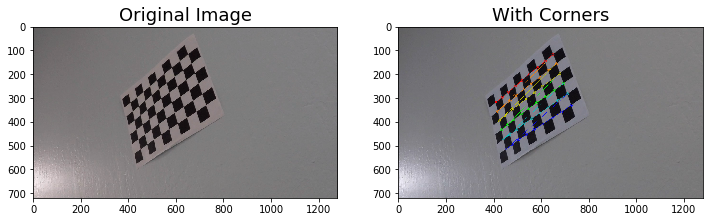

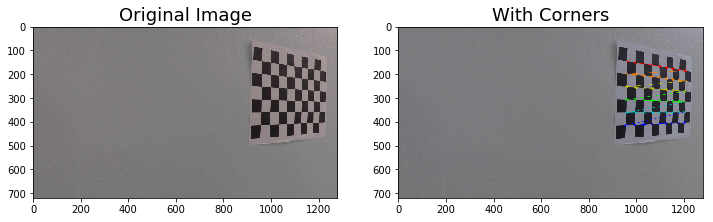

...

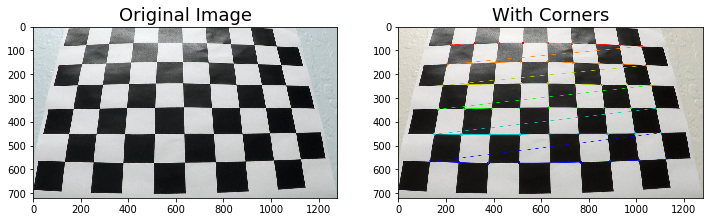

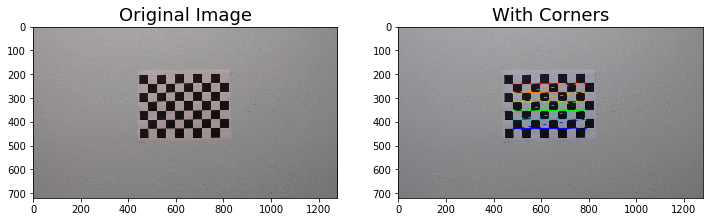

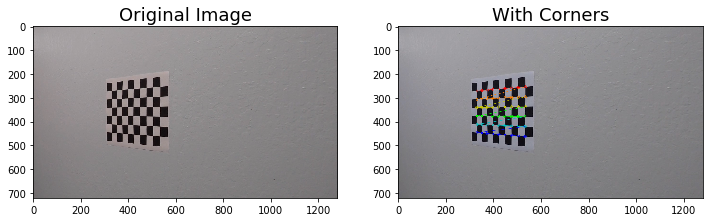

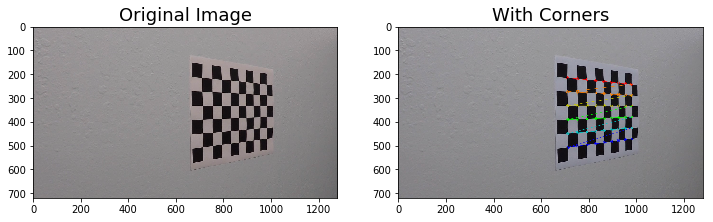

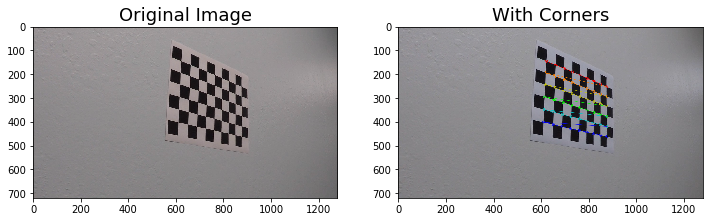

In [1]:
import os
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
from collections import deque
%matplotlib inline

out_dir = 'output_images/calibration/'

nx = 9 # number of inner conners along X
ny = 6 # number of inner conners along Y

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)


# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

proc_fnames = []
failed_fnames = []

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        

            
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=18)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('With Corners', fontsize=18)            

        image_name = os.path.split(fname)[1]

        proc_fnames.append(fname)
        if fname in failed_fnames: failed_fnames.remove(fname)

        write_name = out_dir+'corners_found_ny'+str(ny)+'_nx'+str(nx)+'_' + image_name
        
        cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)
    else:        
        if (fname in failed_fnames) == False:
            failed_fnames.append(fname)

cv2.destroyAllWindows()


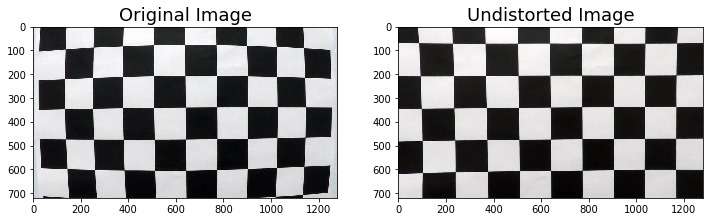

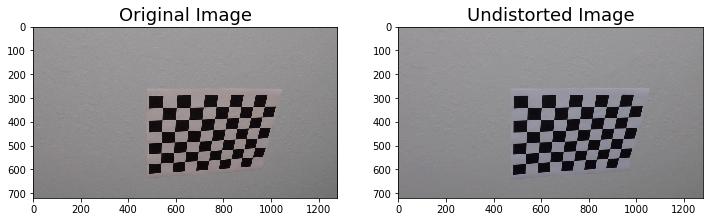

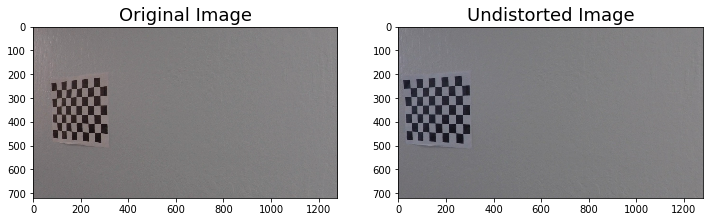

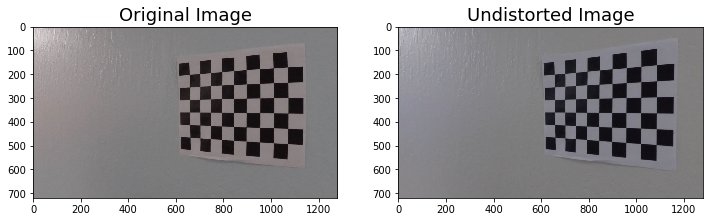

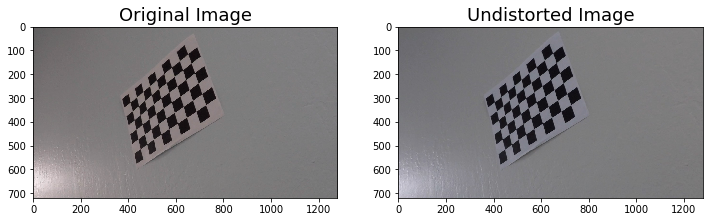

...

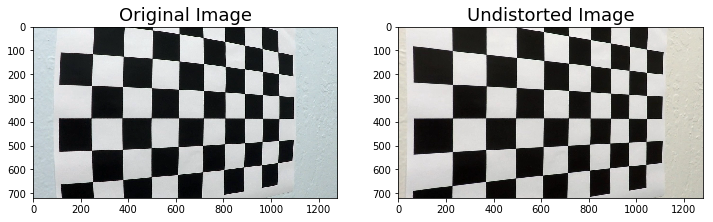

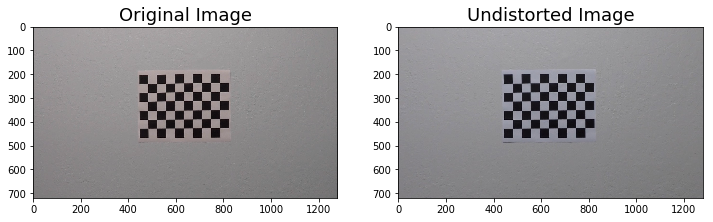

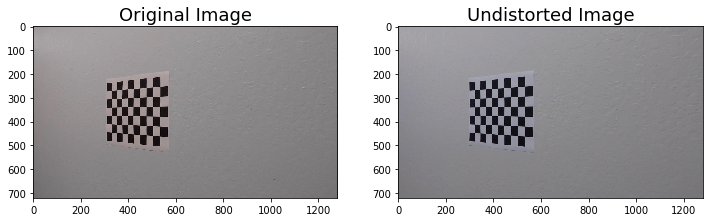

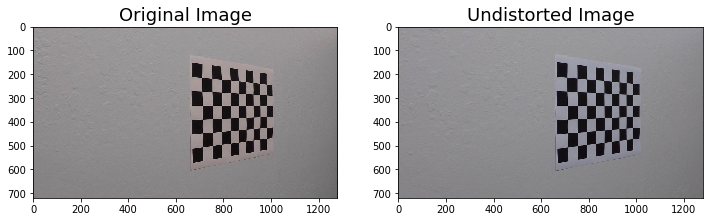

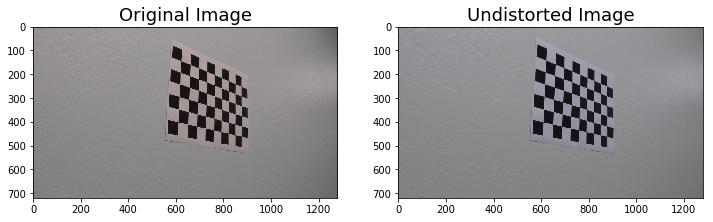

In [2]:
import pickle
%matplotlib inline

# Load pickled camera matrix and distortion coefficients
with open('camera_dist_pickle.p', mode='rb') as f:
    dist_pickle = pickle.load(f)
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]

# Visualize undistortion
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    image_name = os.path.split(fname)[1]
    write_name = out_dir + 'undistorted_' + image_name
    cv2.imwrite(write_name, dst)
    
    cv2.imshow('dst', dst)
    cv2.waitKey(500)

    
    # Draw and display 
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=18)
    ax2.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=18)
        
cv2.destroyAllWindows()

# Pipeline 1. 

## Provide an example of a distortion-corrected image. 

Distortion correction that was calculated via camera calibration has been correctly applied to each image. An example of a distortion corrected image should be included in the writeup (or saved to a folder) and submitted with the project. 

## Step2: Apply a distortion correction to raw images.

In [3]:
# Remove distortion from images
def undistort(image, show=True, read = True):
    if read:
        img = cv2.imread(image)
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=18)
        ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax2.set_title('Undistorted Image', fontsize=18)
    else:
        return undist

In [4]:
images = glob.glob('test_images/*.jpg')

for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    result = img
    
    write_name = 'output_images/tracked' + str(idx) +'.jpg'
    cv2.imwrite(write_name, result)     

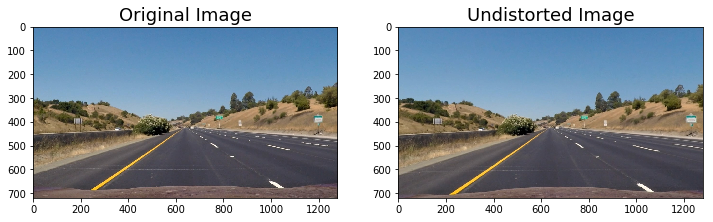

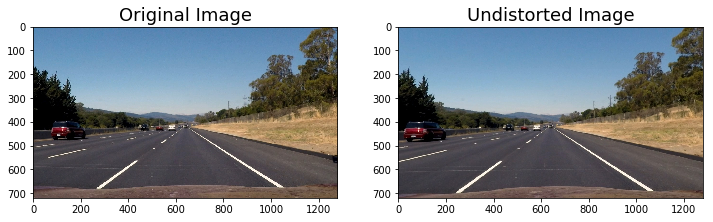

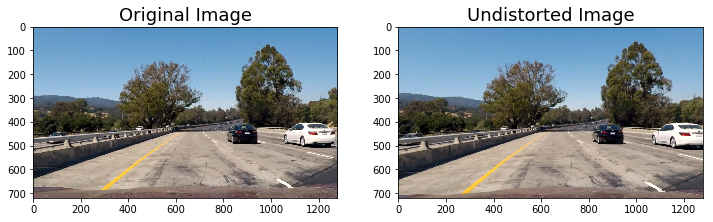

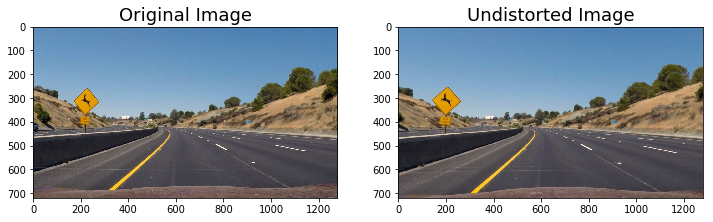

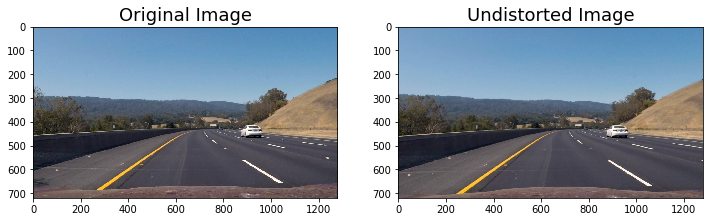

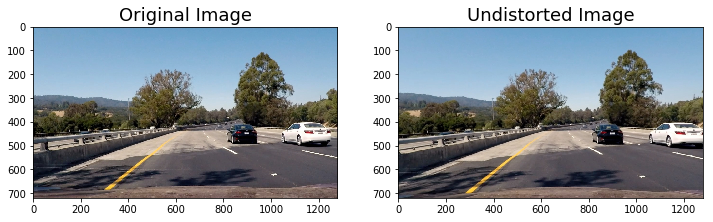

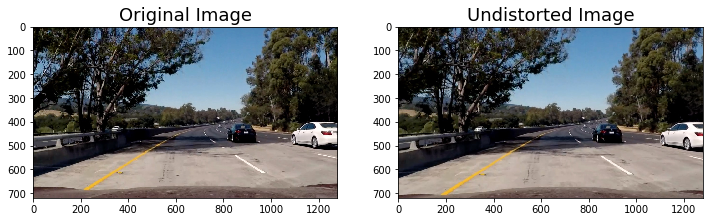

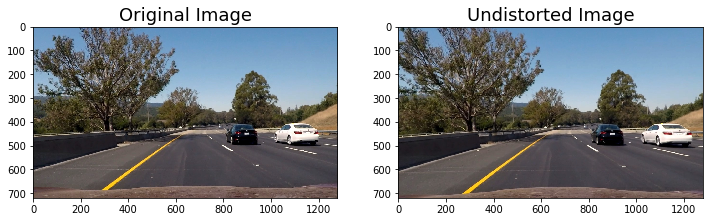

In [5]:
for image in glob.glob('test_images/*.jpg'):
    undistort(image)

# Pipeline 2. 

## Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image. Provide an example of a binary image result. 

A method or combination of methods (i.e., color transforms, gradients) has been used to create a binary image containing likely lane pixels. There is no ”ground truth” here, just visual veriﬁcation that the pixels identiﬁed as part ofthelanelinesare,infact,partofthelines.Examplebinary images should be included in the writeup (or saved to a folder) and submitted with the project.

## Step3: Use color transforms, gradients, etc., to create a thresholded binary image.

In [6]:
import numpy as np
import cv2
class tracker():

    def __init__(self, Mywindow_width, Mywindow_height, Mymargin, My_ym = 1, My_xm = 1, Mysmooth_factor = 15):
    	self.recent_centers = []
    	self.window_width = Mywindow_width
    	self.window_height = Mywindow_height
    	self.margin = Mymargin
    	self.ym_per_pix = My_ym
    	self.xm_per_pix = My_xm
    	self.smooth_factor = Mysmooth_factor

    def find_window_centroids(self, warped):
    	window_width = self.window_width
    	window_height = self.window_height
    	margin = self.margin

    	window_centroids = []
    	window = np.ones(window_width)

    	l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    	l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    	r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    	r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)

    	window_centroids.append((l_center,r_center))

    	for level in range(1,(int)(warped.shape[0]/window_height)):
        	image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis =0)
        	conv_signal = np.convolve(window, image_layer)

        	offset = window_width/2
        	l_min_index = int(max(l_center+offset-margin,0))
        	l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        	l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset

        	r_min_index = int(max(r_center+offset-margin,0))
        	r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        	r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        	window_centroids.append((l_center,r_center))
    	self.recent_centers.append(window_centroids)
    	return np.average(self.recent_centers[-self.smooth_factor:], axis =0)


In [7]:
import numpy as np
import cv2
import pickle
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg



dist_pickle = pickle.load(open('camera_dist_pickle.p', mode='rb'))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    with np.errstate(divide='ignore', invalid='ignore'):
        absgraddir = np.absolute(np.arctan(sobely/sobelx))
        binary_output =  np.zeros_like(absgraddir)
        binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def color_threshold(image, sthresh=(0,255), vthresh=(0,255)):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= sthresh[0]) & (s_channel <= sthresh[1])] = 1

    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    v_channel = hsv[:,:,2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= vthresh[0]) & (v_channel <= vthresh[1])] = 1

    output = np.zeros_like(s_channel)
    output[(s_binary == 1) & (v_binary == 1)] = 1
    return output

def window_mask(width, height, img_ref, center, level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width)):min(int(center+width),img_ref.shape[1])] = 1
    return output

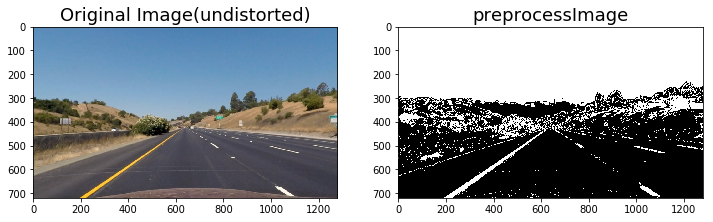

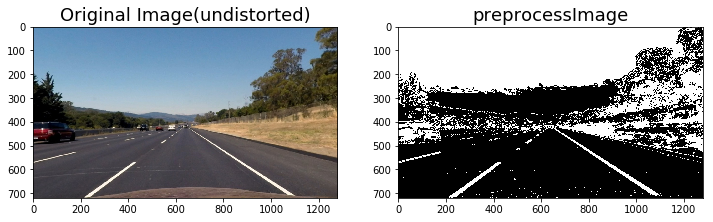

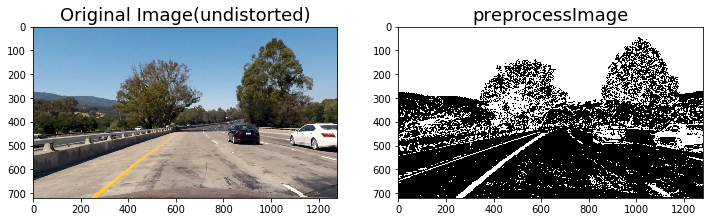

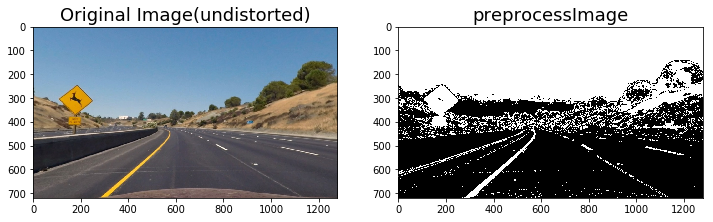

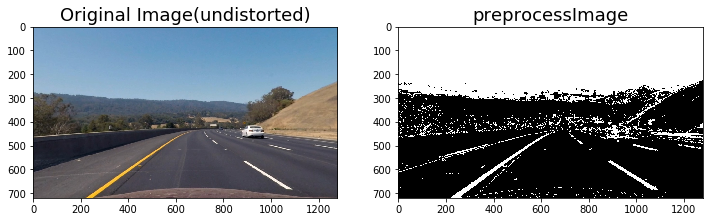

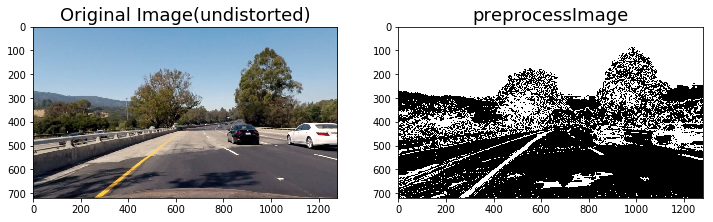

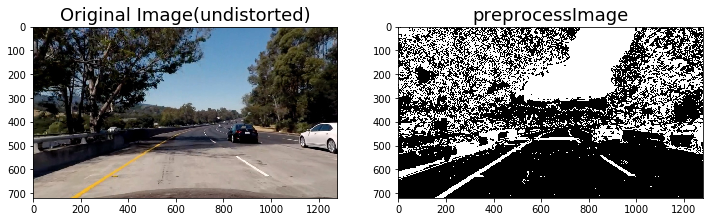

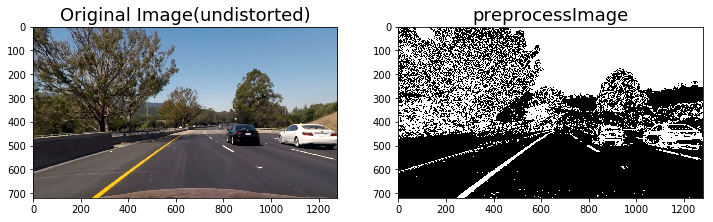

In [8]:
images = glob.glob('./output_images/tracked*.jpg')

for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.undistort(img, mtx, dist, None, mtx)

    preprocessImage = np.zeros_like(img[:,:])
    gradx = abs_sobel_thresh(img, orient='x', thresh=(10,255)) 
    grady = abs_sobel_thresh(img, orient='y', thresh=(10,255)) 
    c_binary = color_threshold(img, sthresh=(90,255), vthresh=(20,255)) 
    preprocessImage[((gradx == 1) & (grady == 1) | (c_binary == 1) )] = 255
    
    result1 = preprocessImage

    write_name = './output_images/combined_0'+str(idx)+'.jpg'
    cv2.imwrite(write_name, result1)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image(undistorted)', fontsize=18)
    
    ax2.imshow(result1)
    ax2.set_title('preprocessImage', fontsize=18)    
    

## Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image. 

OpenCV function or other method has been used to correctly rectify each image to a ”birds-eye view”. Transformed images should be included in the writeup (or saved to a folder) and submitted with the project. 

## Step4: Apply a perspective transform to rectify binary image ("birds-eye view").

# Pipeline 3. 

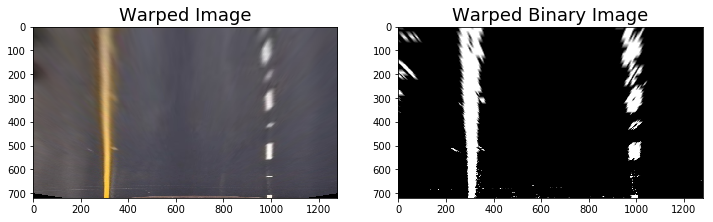

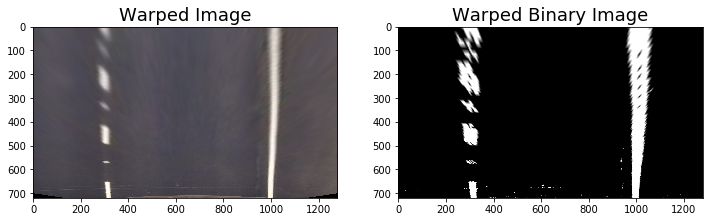

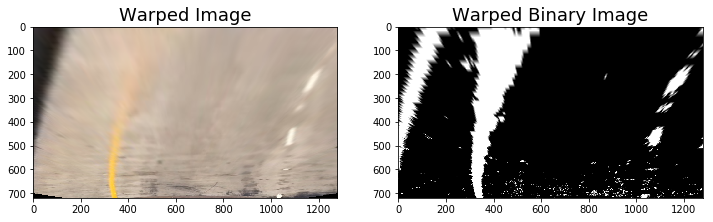

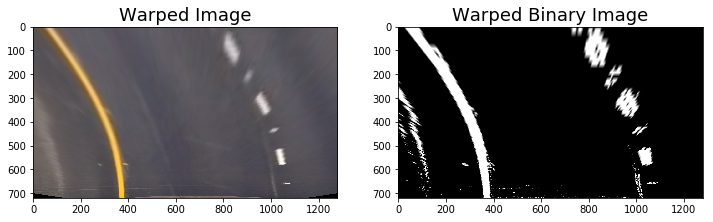

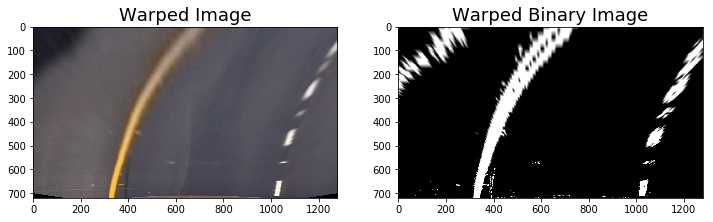

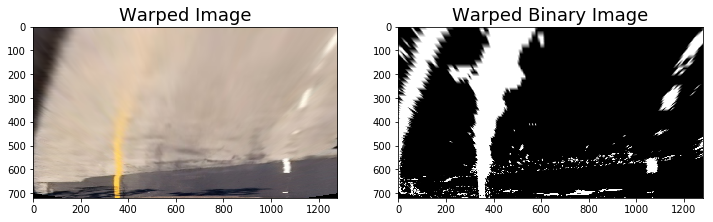

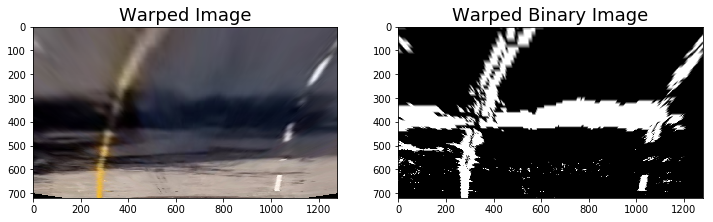

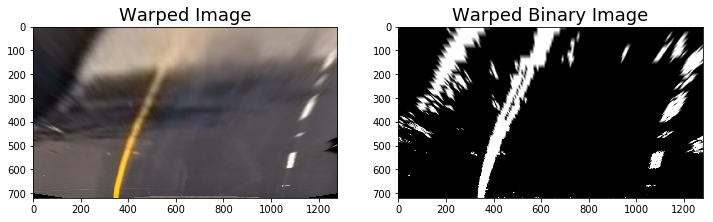

In [9]:
images = glob.glob('./output_images/tracked*.jpg')

for idx, fname in enumerate(images):
    img = cv2.imread(fname)

    img = cv2.undistort(img, mtx, dist, None, mtx)


    preprocessImage = np.zeros_like(img[:,:,0])
    gradx = abs_sobel_thresh(img, orient='x', thresh=(10,255)) 
    grady = abs_sobel_thresh(img, orient='y', thresh=(10,255)) 
    c_binary = color_threshold(img, sthresh=(90,255), vthresh=(20,255)) 
    preprocessImage[((gradx == 1) & (grady == 1) | (c_binary == 1) )] = 255 
   
    img_size = (img.shape[1], img.shape[0])
    bot_width = .90
    mid_width = .08
    height_pct = .62
    bottom_trim = .995
    
    # Source coordinates
    src = np.float32([[img.shape[1]*(.5-mid_width/2),img.shape[0]*height_pct],
                      [img.shape[1]*(.5+mid_width/2),img.shape[0]*height_pct], 
                      [img.shape[1]*(.5+bot_width/2),img.shape[0]*bottom_trim],
                      [img.shape[1]*(.5-bot_width/2),img.shape[0]*bottom_trim]])
    
    offset = img_size[0]*.15
    
    # Destination coordinates
    dst = np.float32([[offset, 0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]], [offset, img_size[1]]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped1 = cv2.warpPerspective(img, M,img_size, flags=cv2.INTER_LINEAR)
    warped2 = cv2.warpPerspective(preprocessImage, M,img_size, flags=cv2.INTER_LINEAR)
    
    result2 = warped1
    result3 = warped2

    write_name1 = './output_images/warped_1'+str(idx)+'.jpg'
    cv2.imwrite(write_name1, result2)
    
    write_name2 = './output_images/combined_1'+str(idx)+'.jpg'
    cv2.imwrite(write_name2, result3)
      
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    
    ax1.imshow(cv2.cvtColor(result2, cv2.COLOR_BGR2RGB))
    ax1.set_title('Warped Image', fontsize=18)
    
    ax2.imshow(result3, cmap='gray')
    ax2.set_title('Warped Binary Image', fontsize=18) 
       

# Pipeline 4. 

## Describe how (and identify where in your code) you identiﬁed lane-line pixels and ﬁt their positions with a polynomial? 

Methods have been used to identify lane line pixels in the rectiﬁed binary image. The left and right line have been identiﬁed and ﬁt with a curved functional form (e.g., spine or polynomial). Example images with line pixels identiﬁed and a ﬁt overplotted should be included in the writeup (or saved to a folder) and submitted with the project. 

## Step5: Detect lane pixels and fit to find the lane boundary.

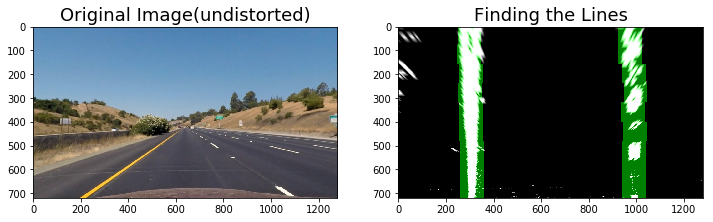

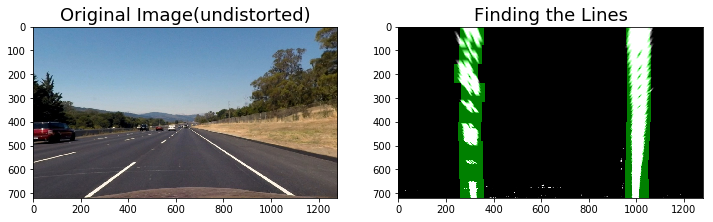

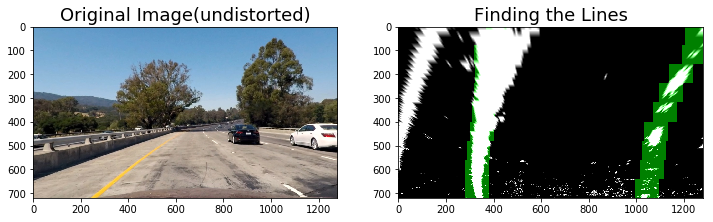

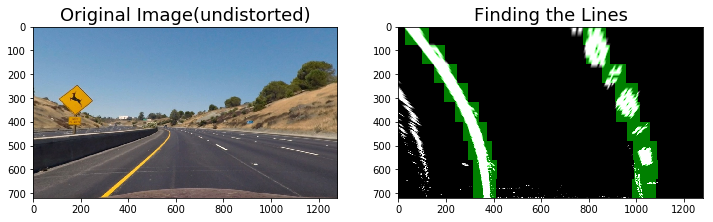

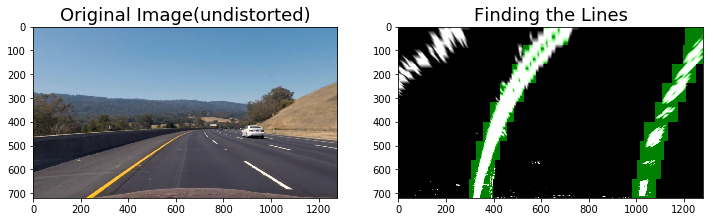

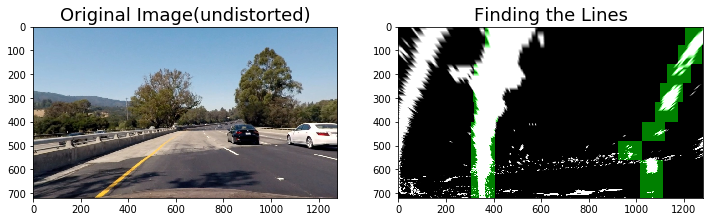

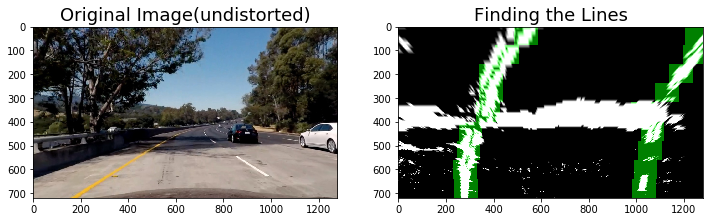

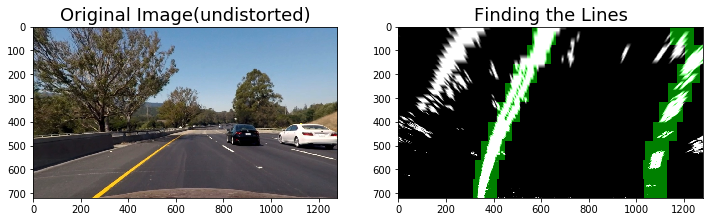

In [10]:
images = glob.glob('./output_images/tracked*.jpg')

for idx, fname in enumerate(images):
    img = cv2.imread(fname)

    img = cv2.undistort(img, mtx, dist, None, mtx)


    preprocessImage = np.zeros_like(img[:,:,0])
    gradx = abs_sobel_thresh(img, orient='x', thresh=(10,255)) 
    grady = abs_sobel_thresh(img, orient='y', thresh=(10,255)) 
    c_binary = color_threshold(img, sthresh=(90,255), vthresh=(20,255)) 
    preprocessImage[((gradx == 1) & (grady == 1) | (c_binary == 1) )] = 255
   
    img_size = (img.shape[1], img.shape[0])
    bot_width = .90
    mid_width = .08
    height_pct = .62
    bottom_trim = .995
    
    # Source coordinates    
    src = np.float32([[img.shape[1]*(.5-mid_width/2),img.shape[0]*height_pct],
                      [img.shape[1]*(.5+mid_width/2),img.shape[0]*height_pct], 
                      [img.shape[1]*(.5+bot_width/2),img.shape[0]*bottom_trim],
                      [img.shape[1]*(.5-bot_width/2),img.shape[0]*bottom_trim]])    

    offset = img_size[0]*.15
    
    # Destination coordinates
    dst = np.float32([[offset, 0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]], [offset, img_size[1]]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(preprocessImage, M,img_size, flags=cv2.INTER_LINEAR)
    
    window_width = 50
    window_height = 80
 
    curve_centers = tracker(Mywindow_width = window_width, Mywindow_height = window_height, Mymargin = 100, My_ym = 10/720, My_xm = 3.7/700, Mysmooth_factor = 30)

    window_centroids = curve_centers.find_window_centroids(warped)
    
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)
    
    for level in range(0,len(window_centroids)):
        l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
        r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
        
        l_points[(l_points == 255) | ((l_mask == 1))] =255
        r_points[(r_points == 255) | ((r_mask == 1))] =255
        
    # Draw the results
    template = np.array(r_points+l_points,np.uint8)
    zero_channel = np.zeros_like(template)
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8)
    warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    result = cv2.addWeighted(warpage, 1, template, 0.5, 0.0)
    

    write_name = './output_images/combined_2'+str(idx)+'.jpg'
    cv2.imwrite(write_name, result)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image(undistorted)', fontsize=18)
    
    ax2.imshow(cv2.addWeighted(warpage, 1, template, 0.5, 0.0))
    ax2.set_title('Finding the Lines', fontsize=18) 

# Pipeline 5. 

## Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center. 

Here the idea is to take the measurements of where the lane lines are and estimate how much the road is curving and where the vehicle is located with respect to the center of the lane. The radius of curvature may be given in meters assuming the curve of the road follows a circle. For the position of the vehicle, you may assume the camera is mounted at the center of the car and the deviation of the midpointofthelanefromthecenteroftheimageistheoffset you’re looking for. As with the polynomial ﬁtting, convert from pixels to meters. 

## Step6: Determine the curvature of the lane and vehicle position with respect to center.

# Pipeline 6. 

## Provide an example image of your result plotted back down onto the road such that the lane area is identiﬁed clearly. 

The ﬁt from the rectiﬁed image has been warped back onto the original image and plotted to identify the lane boundaries. This should demonstrate that the lane boundaries were correctly identiﬁed. An example image with lanes, curvature, and position from center should be included in the writeup (or saved to a folder) and submitted with the project.

## Step7: Warp the detected lane boundaries back onto the original image.

## Step8: Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

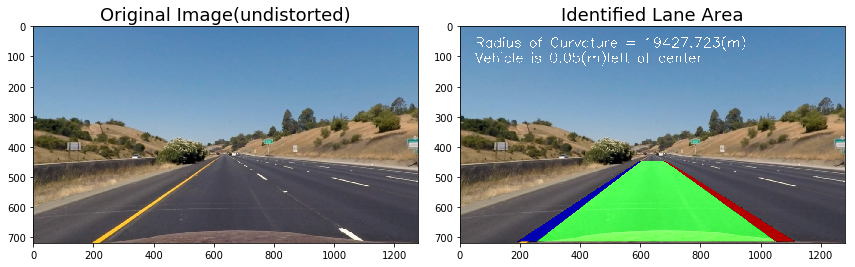

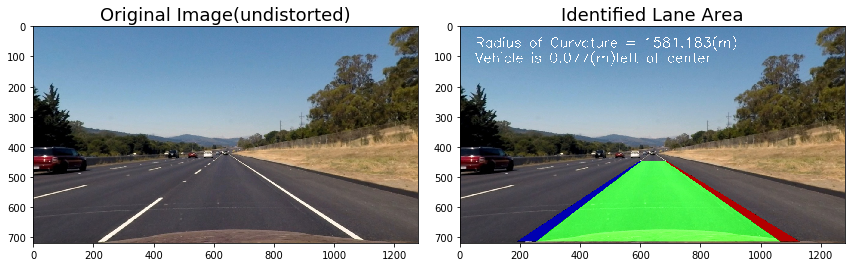

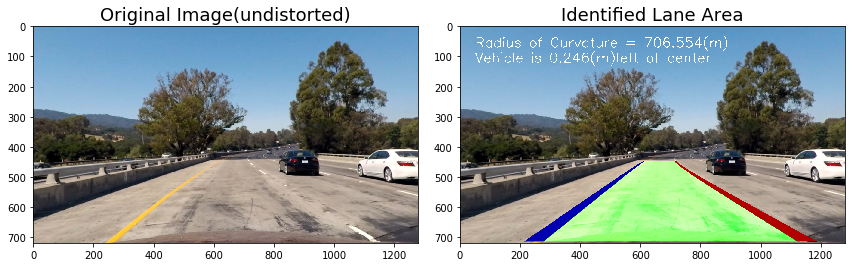

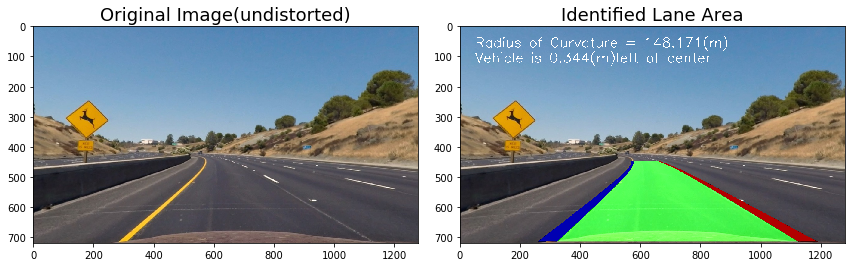

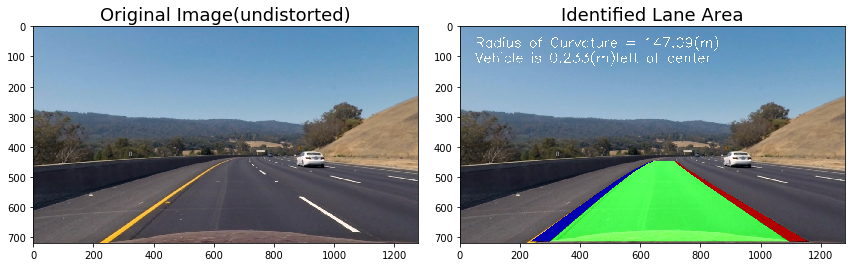

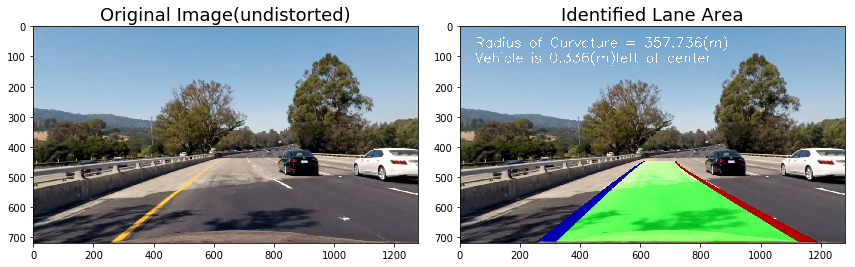

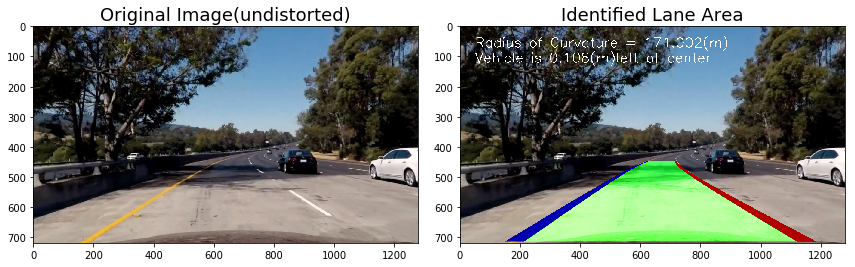

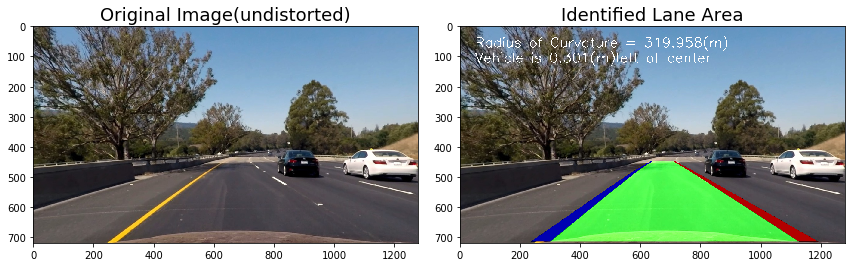

In [11]:
images = glob.glob('./output_images/tracked*.jpg')
    
for idx, fname in enumerate(images):
    img = cv2.imread(fname)

    img = cv2.undistort(img, mtx, dist, None, mtx)

    preprocessImage = np.zeros_like(img[:,:,0])
    gradx = abs_sobel_thresh(img, orient='x', thresh=(10,255)) 
    grady = abs_sobel_thresh(img, orient='y', thresh=(10,255)) 
    c_binary = color_threshold(img, sthresh=(90,255), vthresh=(20,255)) 
    preprocessImage[((gradx == 1) & (grady == 1) | (c_binary == 1) )] = 255
   
    img_size = (img.shape[1], img.shape[0])
    bot_width = .90
    mid_width = .08
    height_pct = .62
    bottom_trim = .995
    
    # Source coordinates
    src = np.float32([[img.shape[1]*(.5-mid_width/2),img.shape[0]*height_pct],
                      [img.shape[1]*(.5+mid_width/2),img.shape[0]*height_pct], 
                      [img.shape[1]*(.5+bot_width/2),img.shape[0]*bottom_trim],
                      [img.shape[1]*(.5-bot_width/2),img.shape[0]*bottom_trim]])    

    offset = img_size[0]*.15
    
    # Destination coordinates
    dst = np.float32([[offset, 0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]], [offset, img_size[1]]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(preprocessImage, M,img_size, flags=cv2.INTER_LINEAR)
    
    window_width = 50
    window_height = 80
 
    curve_centers = tracker(Mywindow_width = window_width, Mywindow_height = window_height, Mymargin = 100, My_ym = 10/720, My_xm = 3.7/700, Mysmooth_factor = 30)

    window_centroids = curve_centers.find_window_centroids(warped)
    
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)
    
    leftx =[]
    rightx = []
    
    
    for level in range(0,len(window_centroids)):
        leftx.append(window_centroids[level][0])
        rightx.append(window_centroids[level][1])
        
        l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
        r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
        
        l_points[(l_points == 255) | ((l_mask == 1))] =255
        r_points[(r_points == 255) | ((r_mask == 1))] =255
        
    # Draw the results
    template = np.array(r_points+l_points,np.uint8)
    zero_channel = np.zeros_like(template)
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8)
    warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    result = cv2.addWeighted(warpage, 1, template, 0.5, 0.0)
    
    yvals = range(0,warped.shape[0])
    
    res_yvals = np.arange(warped.shape[0]-(window_height/2),0,-window_height)
    
    left_fit = np.polyfit(res_yvals, leftx, 2)
    left_fitx = left_fit[0]*yvals*yvals + left_fit[1]*yvals + left_fit[2]
    left_fitx = np.array(left_fitx,np.int32)
    
    right_fit = np.polyfit(res_yvals, rightx, 2)
    right_fitx = right_fit[0]*yvals*yvals + right_fit[1]*yvals + right_fit[2]
    right_fitx = np.array(right_fitx,np.int32)
    
    left_lane = np.array(list(zip(np.concatenate((left_fitx-window_width/2,left_fitx[::-1]+window_width/2), axis=0),np.concatenate((yvals,yvals[::-1]),axis=0))),np.int32)
    right_lane = np.array(list(zip(np.concatenate((right_fitx-window_width/2,right_fitx[::-1]+window_width/2), axis=0),np.concatenate((yvals,yvals[::-1]),axis=0))),np.int32)
    inner_lane = np.array(list(zip(np.concatenate((left_fitx+window_width/2,right_fitx[::-1]-window_width/2), axis=0),np.concatenate((yvals,yvals[::-1]),axis=0))),np.int32)
    
    road = np.zeros_like(img)
    road_bkg = np.zeros_like(img)
    cv2.fillPoly(road,[left_lane],color=[255, 0, 0])
    cv2.fillPoly(road,[right_lane],color=[0, 0, 255])
    cv2.fillPoly(road,[inner_lane],color=[0, 255, 0])
    cv2.fillPoly(road_bkg,[left_lane],color=[255, 255, 255])
    cv2.fillPoly(road_bkg,[right_lane],color=[255, 255, 255])  
    
    road_warped = cv2.warpPerspective(road,Minv,img_size,flags=cv2.INTER_LINEAR)
    road_warped_bkg = cv2.warpPerspective(road_bkg,Minv,img_size,flags=cv2.INTER_LINEAR)
    
    base = cv2.addWeighted(img, 1.0, road_warped_bkg, -1.0, 0.0)
    result = cv2.addWeighted(base, 1.0, road_warped, 0.7, 0.0)
    
    ym_per_pix = curve_centers.ym_per_pix
    xm_per_pix = curve_centers.xm_per_pix
    
    curve_fit_cr = np.polyfit(np.array(res_yvals,np.float32)*ym_per_pix, np.array(leftx,np.float32)*xm_per_pix,2)
    curverad = ((1 + (2*curve_fit_cr[0]*yvals[-1]*ym_per_pix + curve_fit_cr[1])++2)**1.5) /np.absolute(2*curve_fit_cr[0])
    
    
    camera_center = (left_fitx[-1] + right_fitx[-1])/2
    center_diff = (camera_center-warped.shape[1]/2)*xm_per_pix
    side_pos = 'left'
    if center_diff <= 0:
        side_pos = 'right'
    
    cv2.putText(result,'Radius of Curvature = '+str(round(curverad,3))+'(m)',(50,70) , cv2.FONT_HERSHEY_SIMPLEX, 1.5,(255,255,255),2)
    cv2.putText(result,'Vehicle is '+str(abs(round(center_diff,3)))+'(m)'+side_pos+' of center',(50,120), cv2.FONT_HERSHEY_SIMPLEX, 1.5,(255,255,255),2)
    
    write_name = './output_images/combined_3'+str(idx)+'.jpg'
    cv2.imwrite(write_name, result)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image(undistorted)', fontsize=18)
    
    ax2.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    ax2.set_title('Identiﬁed Lane Area', fontsize=18)

# Video Processing Pipeline

## Provide a link to your ﬁnal video output. Your pipeline should perform reasonably well on the entire project video (wobbly lines are ok but no catastrophic failures that would cause the car to drive off the road!)

The image processing pipeline that was established to ﬁnd the lane lines in images successfully processes the video. The output here should be a new video where the lanes are identiﬁed in every frame, and outputs are generated regarding the radius of curvature of the lane and vehicle position within the lane. The pipeline should correctly map out curved lines and not fail when shadows or pavement color changes are present. The output video should be linked to in the writeup and/or saved and submitted with the project.

In [12]:
from IPython.display import HTML
import numpy as np
import cv2
import pickle
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

dist_pickle = pickle.load(open('camera_dist_pickle.p', mode='rb'))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    with np.errstate(divide='ignore', invalid='ignore'):
        absgraddir = np.absolute(np.arctan(sobely/sobelx))
        binary_output =  np.zeros_like(absgraddir)
        binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def color_threshold(image, sthresh=(0,255), vthresh=(0,255)):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= sthresh[0]) & (s_channel <= sthresh[1])] = 1

    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    v_channel = hsv[:,:,2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= vthresh[0]) & (v_channel <= vthresh[1])] = 1

    output = np.zeros_like(s_channel)
    output[(s_binary == 1) & (v_binary == 1)] = 1
    return output

def window_mask(width, height, img_ref, center, level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width)):min(int(center+width),img_ref.shape[1])] = 1
    return output
    
def process_image(img):
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    preprocessImage = np.zeros_like(img[:,:,0])
    gradx = abs_sobel_thresh(img, orient='x', thresh=(10,255)) 
    grady = abs_sobel_thresh(img, orient='y', thresh=(10,255)) 
    c_binary = color_threshold(img, sthresh=(90,255), vthresh=(20,255)) 
    preprocessImage[((gradx == 1) & (grady == 1) | (c_binary == 1) )] = 255
   
    img_size = (img.shape[1], img.shape[0])
    bot_width = .90
    mid_width = .08
    height_pct = .62
    bottom_trim = .995
    
    # Source coordinates
    src = np.float32([[img.shape[1]*(.5-mid_width/2),img.shape[0]*height_pct],
                      [img.shape[1]*(.5+mid_width/2),img.shape[0]*height_pct], 
                      [img.shape[1]*(.5+bot_width/2),img.shape[0]*bottom_trim],
                      [img.shape[1]*(.5-bot_width/2),img.shape[0]*bottom_trim]])    

    offset = img_size[0]*.15
    
    # Destination coordinates
    dst = np.float32([[offset, 0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]], [offset, img_size[1]]])
   
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(preprocessImage, M,img_size, flags=cv2.INTER_LINEAR)
    
    window_width = 50
    window_height = 80
 
    curve_centers = tracker(Mywindow_width = window_width, Mywindow_height = window_height, Mymargin = 100, My_ym = 10/720, My_xm = 3.7/700, Mysmooth_factor = 30)

    window_centroids = curve_centers.find_window_centroids(warped)
    
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)
    
    leftx =[]
    rightx = []
        
    for level in range(0,len(window_centroids)):
        leftx.append(window_centroids[level][0])
        rightx.append(window_centroids[level][1])
        
        l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
        r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
        
        l_points[(l_points == 255) | ((l_mask == 1))] =255
        r_points[(r_points == 255) | ((r_mask == 1))] =255
        
    # Draw the results
    template = np.array(r_points+l_points,np.uint8)
    zero_channel = np.zeros_like(template)
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8)
    warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    result = cv2.addWeighted(warpage, 1, template, 0.5, 0.0)
    
    yvals = range(0,warped.shape[0])
    
    res_yvals = np.arange(warped.shape[0]-(window_height/2),0,-window_height)
    
    left_fit = np.polyfit(res_yvals, leftx, 2)
    left_fitx = left_fit[0]*yvals*yvals + left_fit[1]*yvals + left_fit[2]
    left_fitx = np.array(left_fitx,np.int32)
    
    right_fit = np.polyfit(res_yvals, rightx, 2)
    right_fitx = right_fit[0]*yvals*yvals + right_fit[1]*yvals + right_fit[2]
    right_fitx = np.array(right_fitx,np.int32)
    
    left_lane = np.array(list(zip(np.concatenate((left_fitx-window_width/2,left_fitx[::-1]+window_width/2), axis=0),np.concatenate((yvals,yvals[::-1]),axis=0))),np.int32)
    right_lane = np.array(list(zip(np.concatenate((right_fitx-window_width/2,right_fitx[::-1]+window_width/2), axis=0),np.concatenate((yvals,yvals[::-1]),axis=0))),np.int32)
    inner_lane = np.array(list(zip(np.concatenate((left_fitx+window_width/2,right_fitx[::-1]-window_width/2), axis=0),np.concatenate((yvals,yvals[::-1]),axis=0))),np.int32)
    
    road = np.zeros_like(img)
    road_bkg = np.zeros_like(img)
    cv2.fillPoly(road,[left_lane],color=[255, 0, 0])
    cv2.fillPoly(road,[right_lane],color=[0, 0, 255])
    cv2.fillPoly(road,[inner_lane],color=[0, 255, 0])
    cv2.fillPoly(road_bkg,[left_lane],color=[255, 255, 255])
    cv2.fillPoly(road_bkg,[right_lane],color=[255, 255, 255])  
    
    road_warped = cv2.warpPerspective(road,Minv,img_size,flags=cv2.INTER_LINEAR)
    road_warped_bkg = cv2.warpPerspective(road_bkg,Minv,img_size,flags=cv2.INTER_LINEAR)
    
    base = cv2.addWeighted(img, 1.0, road_warped_bkg, -1.0, 0.0)
    result = cv2.addWeighted(base, 1.0, road_warped, 0.7, 0.0)
    
    ym_per_pix = curve_centers.ym_per_pix
    xm_per_pix = curve_centers.xm_per_pix
    
    curve_fit_cr = np.polyfit(np.array(res_yvals,np.float32)*ym_per_pix, np.array(leftx,np.float32)*xm_per_pix,2)
    curverad = ((1 + (2*curve_fit_cr[0]*yvals[-1]*ym_per_pix + curve_fit_cr[1])++2)**1.5) /np.absolute(2*curve_fit_cr[0])
    
    camera_center = (left_fitx[-1] + right_fitx[-1])/2
    center_diff = (camera_center-warped.shape[1]/2)*xm_per_pix
    side_pos = 'left'
    if center_diff <= 0:
        side_pos = 'right'
    
    cv2.putText(result,'Radius of Curvature = '+str(round(curverad,3))+'(m)',(50,70) , cv2.FONT_HERSHEY_SIMPLEX, 1.5,(255,255,255),2)
    cv2.putText(result,'Vehicle is '+str(abs(round(center_diff,3)))+'(m)'+side_pos+' of center',(50,120), cv2.FONT_HERSHEY_SIMPLEX, 1.5,(255,255,255),2)
   
    return result

In [13]:
Output_video = 'output1_tracked.mp4'
Input_video = 'project_video.mp4'

clip1 = VideoFileClip(Input_video)
video_clip = clip1.fl_image(process_image)
video_clip.write_videofile(Output_video, audio=False)

[MoviePy] >>>> Building video output1_tracked.mp4
[MoviePy] Writing video output1_tracked.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [04:44<00:00,  4.41it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output1_tracked.mp4 



In [14]:
from IPython.display import HTML
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('output1_tracked.mp4'))

In [15]:
Output_video = 'output2_tracked.mp4'
Input_video = 'challenge_video.mp4'

clip1 = VideoFileClip(Input_video)
video_clip = clip1.fl_image(process_image)
video_clip.write_videofile(Output_video, audio=False)

[MoviePy] >>>> Building video output2_tracked.mp4
[MoviePy] Writing video output2_tracked.mp4


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [01:48<00:00,  4.62it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output2_tracked.mp4 



In [16]:
from IPython.display import HTML
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('output2_tracked.mp4'))

In [17]:
Output_video = 'output3_tracked.mp4'
Input_video = 'harder_challenge_video.mp4'

clip1 = VideoFileClip(Input_video)
video_clip = clip1.fl_image(process_image)
video_clip.write_videofile(Output_video, audio=False)

[MoviePy] >>>> Building video output3_tracked.mp4
[MoviePy] Writing video output3_tracked.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [04:36<00:00,  4.42it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output3_tracked.mp4 



In [18]:
from IPython.display import HTML
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('output3_tracked.mp4'))